In [3]:
import datetime
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import scipy.integrate as integrate
import plotly.graph_objects as go
import os


In [4]:
def make_time_col(df, start_date, start_time):
    """
    makes a time column that can be added to a df. converts a date string and a time string
    (which can be retrieved from the file names) and converts them to a datetime thing
    start_date: date in YYYYMMDD format (string)
    start_time: time in HHMMSS format (string)
    """
    # turns "20210122", "030100" into datetime object
    time_start = datetime.strptime(start_date + start_time, "%Y%m%d%H%M%S")
    # make time range df column by using start date, making new line every 2s for the shape of the df
    time_range = pd.date_range(time_start, periods=df.shape[0], freq='2s')
    # find time and hrs elapsed
    time_elapsed = pd.Timedelta = time_range[-1] - time_start
    hrs_elapsed = time_elapsed.total_seconds() / 3600

    return time_range, hrs_elapsed


In [19]:
def visualize_data(folder_path, file_name, threshold, curve_type, show_plot=True):
    """
    plot data as probability of each event vs. time
    """
    # add an explicit “time” column to get 0,1,2,… on x-axis
    types = ['seizure', 'lpd', 'gpd', 'lrda', 'grda', 'other']
    # file_path = "C:\\Users\\nbarnouw\\PycharmProjects\\IIIC-SPaRCNet\\SPaRCNet\\Data\\iiic\\ecmo_512\\" + file_name
    file_path = folder_path + file_name
    df = pd.read_csv(file_path, header=None, names=types)

    # get start date and time from file name
    start_date, start_time = file_path.split('_')[-3:-1]
    df['time'], hrs_elapsed = make_time_col(df, start_date, start_time)

    # line chart
    fig = px.line(
        df,
        x="time",
        y=types,  # list of your six event‐columns
        title="Event Probabilities Over Time"
    )

    fig.update_layout(
        yaxis_title="Probability",
    )

    # range‐slider under the x‐axis
    fig.update_xaxes(
        rangeslider_visible=True,
        title_text="Time (segment index)"
    )
    fig.add_hline(y=threshold)


    # integrate area under specific curve
    time = df.index.values
    y = df[curve_type].values
    excess = np.clip(y - threshold, a_min=0, a_max=None)

    # area = np.trapezoid(excess, x=time)
    area = integrate.trapezoid(excess, x=time)

    y = df[curve_type].values
    clipped = np.clip(y, a_min=threshold, a_max=None)

    fig.add_trace(
        go.Scatter(
            x=df['time'],
            y=[threshold]*len(df),
            mode='lines',
            line=dict(color='gray', width=1, dash='dash'),
            name=f"Threshold = {threshold}",
            showlegend=False   # don’t duplicate in legend
        )
    )

    # add a filling trace for the chosen curve
    fig.add_trace(
        go.Scatter(
            x=df['time'],
            y=clipped,
            mode='lines',
            line=dict(color='rgba(0,0,0,0)'),   # invisible line
            fill='tonexty',                      # fill to the previous y (the threshold trace)
            fillcolor='rgba(31,119,180,0.2)',    # semi‐transparent blue
            name=f"Area above {curve_type}",
            showlegend=False
        )
    )

    print(f"Integrated area above {threshold:.2f} for {curve_type} is {area:.2f}")

    if show_plot:
        fig.show()
    return area, hrs_elapsed

In [7]:
def make_threshold_df(folder_path, file_directory, num_thresh, injury_type, max_of_pt, excluded_pts):
    """
    makes a df with threshold and each patient's total area for injury type. size is [# thresh x # pt files]
    file_directory: directory where the file is. this code runs through each file in the directory
    num_thresh: number of thresholds to test
    """
    thresholds = np.linspace(0,1, num=num_thresh)
    d = {}
    max_pt = {}
    for file_name_ in file_directory:
        # find patient number
        pt_num = file_name_.split('_')[1]
        if pt_num in excluded_pts:
            continue
        elif pt_num not in d.keys():
            d[pt_num] = [0] * num_thresh

        for i, threshold in enumerate(thresholds):
            area, hrs_elapsed = visualize_data(folder_path, file_name_, threshold, injury_type, show_plot=False)
            if max_of_pt:
                if hrs_elapsed < 2:
                    # print('too small of a recording', pt_num)
                    continue
                if pt_num in d.keys():
                    # print('comparing current with existing pt file', pt_num)
                    d[pt_num][i] = max(d[pt_num][i], area/hrs_elapsed)
                    max_pt[pt_num] = file_name_
                else:
                    # print('new patient, adding vals into pt dict', pt_num)
                    d[pt_num][i] = area/hrs_elapsed
                    max_pt[pt_num] = file_name_
            else:
                d[pt_num][i] += area/hrs_elapsed
    df = pd.DataFrame(data=d)
    df.insert(0, "thresholds", thresholds)
    print(max_pt)
    return df

In [64]:
# file_directory = os.listdir("C:\\Users\\nbarnouw\\PycharmProjects\\IIIC-SPaRCNet\\SPaRCNet\\Data\\iiic\\ecmo_512")
file_directory = os.listdir("/Users/nataliebarnouw/Documents/GitHub/IIIC-SPaRCNet/SPaRCNet/Data/iiic/ecmo_512")
folder_path = "/Users/nataliebarnouw/Documents/GitHub/IIIC-SPaRCNet/SPaRCNet/Data/iiic/ecmo_512/"
# excluded_pts = ["005", "024", "030", "033", "047", "049"]
excluded_pts = ["005", "047", "049"]
df_trial_sz = make_threshold_df(folder_path, file_directory, 8, 'seizure',True, excluded_pts)
df_trial_lpd = make_threshold_df(folder_path, file_directory, 8, 'lpd',True, excluded_pts)
df_trial = df_trial_lpd + df_trial_sz
df_trial['thresholds'] = df_trial['thresholds']/2
# df_seiz = make_threshold_df(folder_path, file_directory, 8, 'seizure',True, excluded_pts)
# df_lpd = make_threshold_df(folder_path, file_directory, 8, 'lpd', True, excluded_pts)
# df_both = df_lpd + df_seiz
# df_both['thresholds'] = df_both['thresholds']/2
#
# df_norm = df_both.copy() #df_both / df_both['thresholds'][0]
# cols = df_both.columns.difference(['thresholds'])
# df_norm[cols] = df_norm[cols].div(df_norm.loc[0, cols])
#
# df_lpd_norm = df_lpd.copy()
# df_lpd_norm[cols] = df_lpd_norm[cols].div(df_lpd_norm.loc[0, cols])
# df_sz_norm = df_seiz.copy()
# df_sz_norm[cols] = df_sz_norm[cols].div(df_sz_norm.loc[0, cols])

# print(df_seiz)
# print(df_both)
# print(df_norm)
# print(df_sz_norm)
# print(df_lpd_norm)

Integrated area above 0.00 for seizure is 2820.63
Integrated area above 0.14 for seizure is 2166.86
Integrated area above 0.29 for seizure is 1613.66
Integrated area above 0.43 for seizure is 1140.83
Integrated area above 0.57 for seizure is 771.59
Integrated area above 0.71 for seizure is 456.69
Integrated area above 0.86 for seizure is 150.09
Integrated area above 1.00 for seizure is 0.00
Integrated area above 0.00 for seizure is 7210.72
Integrated area above 0.14 for seizure is 5411.48
Integrated area above 0.29 for seizure is 3635.73
Integrated area above 0.43 for seizure is 2026.35
Integrated area above 0.57 for seizure is 856.59
Integrated area above 0.71 for seizure is 255.25
Integrated area above 0.86 for seizure is 39.60
Integrated area above 1.00 for seizure is 0.00
Integrated area above 0.00 for seizure is 12590.34
Integrated area above 0.14 for seizure is 9087.48
Integrated area above 0.29 for seizure is 5783.87
Integrated area above 0.43 for seizure is 3146.33
Integrated a

In [125]:
file_path = "/Users/nataliebarnouw/Documents/GitHub/IIIC-SPaRCNet/SPaRCNet/Data/iiic/ECMO_sz_data.csv"
ecmo_sz_data = pd.read_csv(file_path)
# seizure binary list, indexed by coin run id
binary_sz = ecmo_sz_data["focalsz_se"]
binary_sz.index = ecmo_sz_data["coin_run_id"]
# stroke binary list, indexed by coin run id
binary_stroke = ecmo_sz_data["img_fii"]
binary_stroke.index = ecmo_sz_data["coin_run_id"]
# print(binary_sz)

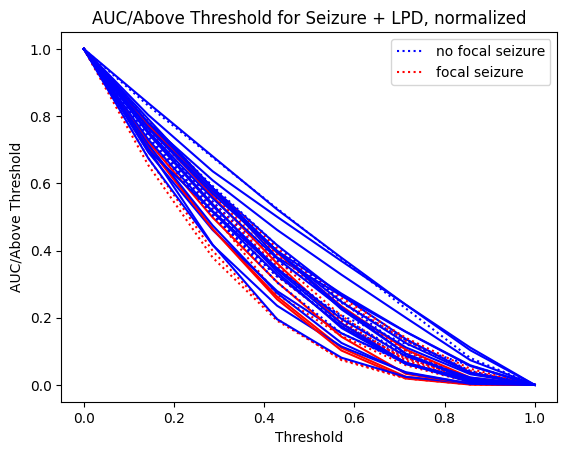

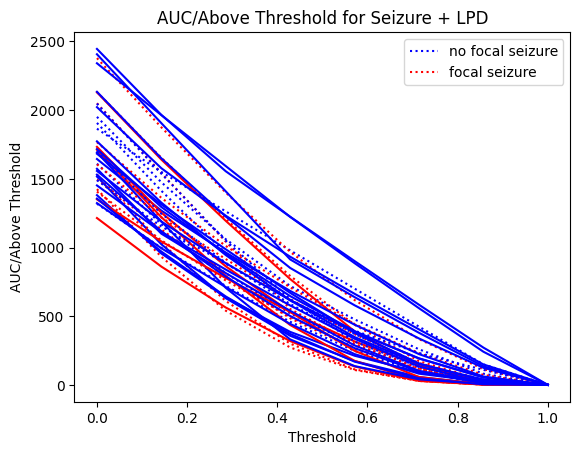

In [75]:
def plot_thresholds(df, binary_sz, binary_stroke, name):
    fig, ax = plt.subplots()
    x = df.thresholds
    binary_labels_sz = list()
    binary_labels_stroke = list()

    cols = df.drop(columns="thresholds").columns
    patient_cols = sorted(cols, key=lambda c: int(c))
    for pt_num in patient_cols: # for each patient, exclude first column bc they're just thresholds
        y = df[pt_num]
        pt_num = int(pt_num)
        binary_labels_sz.append(binary_sz[pt_num])
        binary_labels_stroke.append(binary_stroke[pt_num])
        label = "focal seizure" if binary_sz[pt_num] == 1 else "no focal seizure"
        color = 'blue' if binary_sz[pt_num] == 0 else 'red'
        linestyle = 'dotted' if binary_stroke[pt_num] == 1 else 'solid'

        if (binary_sz[pt_num] == 1 and "focal seizure" not in ax.get_legend_handles_labels()[1]) or \
           (binary_sz[pt_num] == 0 and "no focal seizure" not in ax.get_legend_handles_labels()[1]):
            ax.plot(x, y, color=color, label=label, linestyle = linestyle)
        else:
            ax.plot(x, y, color=color, linestyle = linestyle)
    ax.set_xlabel('Threshold')
    ax.set_ylabel('AUC/Above Threshold')
    ax.set_title(f"AUC/Above Threshold for {name}")
    ax.legend()
    plt.show()
    return binary_labels_sz, binary_labels_stroke

both_sz_norm, both_stroke_norm = plot_thresholds(df_norm, binary_sz, binary_stroke, "Seizure + LPD, normalized")

# plot_thresholds(df_sz_norm, binary_sz, binary_stroke, "Sz only, normalized")

# plot_thresholds(df_lpd_norm, binary_sz, binary_stroke, "LPD only, normalized")

both_sz, both_stroke = plot_thresholds(df_both, binary_sz, binary_stroke, 'Seizure + LPD')

# plot_thresholds(df_seiz, binary_sz, binary_stroke, "Seizure only")
# plot_thresholds(df_lpd, binary_sz, binary_stroke, "LPD only")

In [70]:
print(df_both.iloc[2])


thresholds       0.285714
008           1554.870190
028            915.891885
026            784.677799
009           1060.331733
011           1194.019754
015            540.039583
018            963.544944
041            944.985951
020            760.092123
021            793.506369
045            885.756782
032            888.557973
004            610.964227
042           1231.382371
037            839.489782
025           1399.575404
002            813.130880
029            959.735558
034           1408.780320
043            986.940042
019           1262.815117
050           1050.306088
017            630.988520
040            813.893429
022            706.537952
006           1042.570301
007            563.264187
044            787.751734
003           1207.437726
014           1011.382249
035           1225.341782
027            882.264496
046            643.701964
048           1592.658821
001            720.109592
036            777.627749
023            863.433141
038         

In [83]:
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm

# keep some to build model, some to predict (80/20, 15 to train, predict on 5) (save for later)
def plot_log_reg(df_used, binary_labels, stroke_flags, thresh_idx, label, interaction=True):
    row = df_used.iloc[thresh_idx] # get val of each pt AUC for given threshold

    #  drop the extra index‐column and thresholds, just get patient numbers
    patient_cols = [c for c in df_used.columns if c not in ("index", "thresholds")]
    # extract X (n_patients × 1) and y
    X_threshold = row[patient_cols].values.reshape(-1, 1) # 43x1, each pt's AUC at given threshold
    # X_threshold_centered = X_threshold - X_threshold.mean()
    x_stroke    = np.asarray(stroke_flags, dtype=float).reshape(-1, 1)

    if interaction:
        X_interaction = X_threshold * x_stroke
        X = np.hstack([X_threshold, x_stroke, X_interaction]) # predictors side by side
    else:
        X = np.hstack([X_threshold, x_stroke]) # non-interaction case

    y = np.array(binary_labels) #outcome vector (seizure/no sz)

    # add a constant (intercept) term
    X_sm = sm.add_constant(X) # prepends column of 1s, so 3 total parameters

    # fit a statsmodels Logit
    logit = sm.Logit(y, X_sm)
    result = logit.fit(disp=True)  # disp=False suppresses the optimization printout

    # view the full summary (coef, std err, z, P>|z|, [0.025, 0.975])
    print(result.summary())

    # extract odds ratios and CIs easily:
    odds_ratios = np.exp(result.params)
    conf = result.conf_int()
    conf_odds = np.exp(conf)
    print("ORs:\n", odds_ratios)
    print("95% CI for ORs:\n", conf_odds)

    # prepare grid for fitted curve
    x_min, x_max = X[:,0].min(), X[:,0].max()
    x_grid   = np.linspace(x_min, x_max, 200).reshape(-1, 1)  # (200,1)
    stroke_0 = np.zeros_like(x_grid) #stroke fixed at 0, so we can predict fitted probability w/ stroke=0
    if interaction:
        inter_0 = x_grid * stroke_0 # also all zeroes
        X_grid   = np.hstack([x_grid, stroke_0, inter_0])  # (200,2)
    else:
        X_grid   = np.hstack([x_grid, stroke_0]) # for non-interaction case

    X_grid_sm = sm.add_constant(X_grid)    # add the intercept column

    y_prob = result.predict(X_grid_sm) # (200, )

    plt.figure(figsize=(6,4))
    plt.scatter(X[:,0], y, s=50, alpha=0.6, label="observations (0/1)")
    plt.plot(x_grid, y_prob, color="red", lw=2, label="logistic fit")
    plt.xlabel("AUC/above threshold")
    plt.ylabel("P(Label=1)")
    plt.title(f"Logistic fit at threshold {df_used['thresholds'][thresh_idx]} for {label}")
    plt.legend()
    plt.tight_layout()
    plt.show()
    return None

Optimization terminated successfully.
         Current function value: 0.587097
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   40
Model:                          Logit   Df Residuals:                       36
Method:                           MLE   Df Model:                            3
Date:                Fri, 15 Aug 2025   Pseudo R-squ.:                 0.09321
Time:                        10:27:23   Log-Likelihood:                -23.484
converged:                       True   LL-Null:                       -25.898
Covariance Type:            nonrobust   LLR p-value:                    0.1848
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2422      1.908     -0.127      0.899      -3.983       3.498
x1            -0.0012      0.

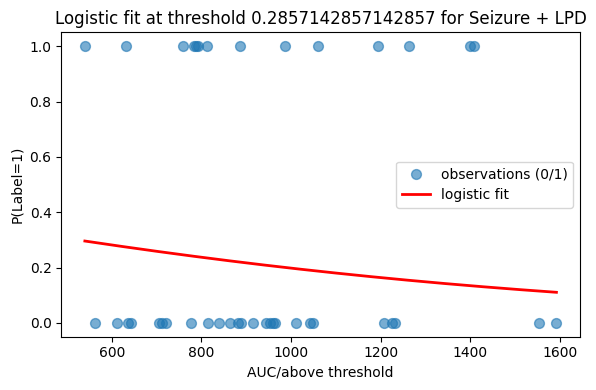

Optimization terminated successfully.
         Current function value: 0.618001
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   40
Model:                          Logit   Df Residuals:                       36
Method:                           MLE   Df Model:                            3
Date:                Fri, 15 Aug 2025   Pseudo R-squ.:                 0.09365
Time:                        10:27:23   Log-Likelihood:                -24.720
converged:                       True   LL-Null:                       -27.274
Covariance Type:            nonrobust   LLR p-value:                    0.1640
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.7656      1.604     -0.477      0.633      -3.909       2.378
x1          -4.85e-05      0.

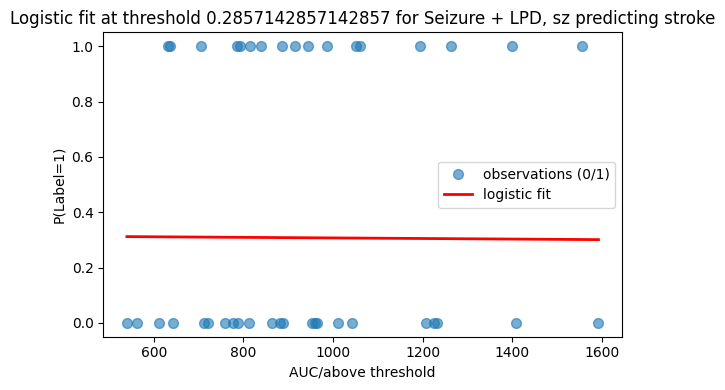

Optimization terminated successfully.
         Current function value: 0.574428
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   40
Model:                          Logit   Df Residuals:                       36
Method:                           MLE   Df Model:                            3
Date:                Fri, 15 Aug 2025   Pseudo R-squ.:                  0.1128
Time:                        10:27:23   Log-Likelihood:                -22.977
converged:                       True   LL-Null:                       -25.898
Covariance Type:            nonrobust   LLR p-value:                    0.1196
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.3656      4.149      0.811      0.417      -4.765      11.497
x1            -8.8583      7.

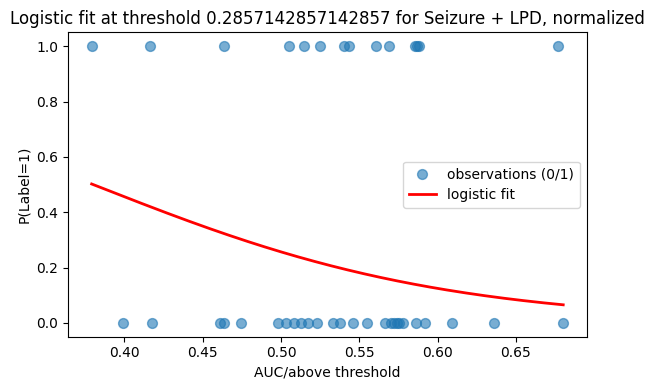

In [81]:
plot_log_reg(df_both, both_sz, both_stroke, 2, "Seizure + LPD")
plot_log_reg(df_both, both_stroke, both_sz, 2, "Seizure + LPD, sz predicting stroke")
# can it predict seizure?
# plot_log_reg(df_both, both_sz, 2, "Seizure + LPD")
# plot_log_reg(df_seiz, sz_only_sz, 2, "Seizure")
# plot_log_reg(df_lpd, lpd_sz, 2, "LPD")

# can it predict stroke?
# plot_log_reg(df_both, both_stroke, 2, "Seizure + LPD")
# plot_log_reg(df_seiz, sz_stroke, 2, "Seizure")
# plot_log_reg(df_lpd, lpd_stroke, 2, "LPD")

#normalized
plot_log_reg(df_norm, both_sz_norm, both_stroke_norm, 2, "Seizure + LPD, normalized")
# plot_log_reg(df_sz_norm, both_sz_norm, 2, "Seizure only, normalized")
# plot_log_reg(df_lpd_norm, both_sz_norm, 2, "LPD only, normalized")

In [142]:
def random_forest(X, y, thresh_idx, label):

    X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # train model
    model = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced', n_jobs=-1)
    model.fit(X_train, Y_train)

    Y_pred = model.predict(X_test)

    # For classification
    print(f"Accuracy: {accuracy_score(Y_test, Y_pred)}")
    print(classification_report(Y_test, Y_pred))
    print(confusion_matrix(Y_test, Y_pred))

    # regression
    print(f"Mean Squared Error: {mean_squared_error(Y_test, Y_pred)}")
    return None

In [153]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier # could also use RandomForestRegressor
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix # for evaluation
from sklearn.metrics import mean_squared_error # for regression

df_both_pt = df_both.T.copy()
df_both_pt.index.name = "coin_run_id"

df_both_pt = df_both_pt.reset_index()

df_both_pt = df_both_pt[df_both_pt["coin_run_id"] != "thresholds"]
df_both_pt = df_both_pt.sort_values(by="coin_run_id", key=lambda x: x.astype(int))
df_both_pt = df_both_pt.sort_values("coin_run_id").reset_index(drop=True)

ecmo_sz_data['coin_run_id'] = ecmo_sz_data["coin_run_id"].astype(str).str.strip().str.lstrip("0").replace({"": "0"}).str.zfill(3)

df_full = pd.merge(
    ecmo_sz_data, df_both_pt,
    left_on="coin_run_id", right_on="coin_run_id",
    how="inner",  # only patients in both
    validate="one_to_one"
)

thresh_cols = [c for c in df_full.columns if type(c) == int]   # if they’re 0,1,2, i.e. threshold idxs
clin_cols = ["img_fii", "gensz_se", "focal_eds", "gen_eds"] # use different features

X_all = df_full[thresh_cols + clin_cols].to_numpy()
X_thresh = df_full[thresh_cols].to_numpy()

y = df_full['focalsz_se'].to_numpy()
# print(X_all)
# print(X_thresh)
# auc_ids = set(df_both_pt["coin_run_id"])
# print(auc_ids)
# print(ecmo_sz_data)
# print(df_full)
print(random_forest(X_all, y, 2, "Seizure + LPD"))

Accuracy: 0.5
              precision    recall  f1-score   support

           0       0.43      1.00      0.60         3
           1       1.00      0.20      0.33         5

    accuracy                           0.50         8
   macro avg       0.71      0.60      0.47         8
weighted avg       0.79      0.50      0.43         8

[[3 0]
 [4 1]]
Mean Squared Error: 0.5
None


In [85]:
# starting to set up ability to run through each fie in the directory
# total_file_list = os.listdir("C:\\Users\\nbarnouw\\PycharmProjects\\IIIC-SPaRCNet\\SPaRCNet\\Data\\iiic\\ecmo_512")
total_file_list = os.listdir("/Users/nataliebarnouw/Documents/GitHub/IIIC-SPaRCNet/SPaRCNet/Data/iiic/ecmo_512")
#hardcoded to use first file in list
# file_name = total_file_list[4]
file_name = 'XK4J_008_20160731_132300_score.csv'
print(file_name)
# file_path for a specific file. start with hardcoded first file in directory. or use specific filepath if needed
# file_path = "C:\\Users\\nbarnouw\\PycharmProjects\\IIIC-SPaRCNet\\SPaRCNet\\Data\\iiic\\ecmo_512\\" + file_name
folder_path = "/Users/nataliebarnouw/Documents/GitHub/IIIC-SPaRCNet/SPaRCNet/Data/iiic/ecmo_512/"
area, hours_elapsed = visualize_data(folder_path, file_name, 0, 'seizure')
print(area/hours_elapsed)

XK4J_008_20160731_132300_score.csv
Integrated area above 0.00 for seizure is 9676.84


403.22965605661966
